In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report,ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder, OneHotEncoder


In [2]:
from google.colab import files
uploaded = files.upload()

import pandas as pd

df1 = pd.read_csv('modis_2021_India.csv')
df2 = pd.read_csv('modis_2022_India.csv')
df3 = pd.read_csv('modis_2023_India.csv')



Saving modis_2021_India.csv to modis_2021_India.csv
Saving modis_2022_India.csv to modis_2022_India.csv
Saving modis_2023_India.csv to modis_2023_India.csv


In [3]:
df1.head()    # this will by deafult gives us 5 rows


# but suppose we have to give our desired number of rows then we can type that  much numbers inside the head :-

#df1.head(10)    # this will by deafult gives us 10 rows


# and for last 5 rows we can use :-

#df1.tail()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44,6.03,292.6,8.6,D,0
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37,6.03,287.4,9.0,D,0
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547,Terra,MODIS,8,6.03,286.5,5.4,D,0
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46,6.03,287.7,10.7,D,0
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43,6.03,287.6,9.0,D,0


In [4]:
df2.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,30.1138,80.0756,300.0,1.2,1.1,2022-01-01,511,Terra,MODIS,7,6.03,288.4,7.1,D,0
1,23.7726,86.2078,306.1,1.6,1.2,2022-01-01,512,Terra,MODIS,62,6.03,293.5,10.4,D,2
2,22.2080,84.8627,304.8,1.4,1.2,2022-01-01,512,Terra,MODIS,42,6.03,293.3,5.8,D,2
3,23.7621,86.3946,306.9,1.6,1.2,2022-01-01,512,Terra,MODIS,38,6.03,295.2,9.3,D,2
4,23.6787,86.0891,303.6,1.5,1.2,2022-01-01,512,Terra,MODIS,52,6.03,293.1,7.2,D,2


In [5]:
df3.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,9.3280,77.6247,318.0,1.1,1.0,2023-01-01,821,Aqua,MODIS,62,61.03,305.0,7.6,D,0
1,10.4797,77.9378,313.8,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,299.4,4.3,D,0
2,13.2478,77.2639,314.7,1.0,1.0,2023-01-01,822,Aqua,MODIS,55,61.03,302.4,4.9,D,0
3,12.2994,78.4085,314.3,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,301.9,4.8,D,0
4,14.1723,75.5024,338.4,1.2,1.1,2023-01-01,823,Aqua,MODIS,88,61.03,305.3,41.5,D,0


In [6]:
# So there are 3 different files we have , and performing task on this 3 one by one becomes challenge for our , so we can merge these 3 files in one to save our time

df=pd.concat([df1,df2,df3] , ignore_index=True)
df.head()


,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44,6.03,292.6,8.6,D,0
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37,6.03,287.4,9.0,D,0
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547,Terra,MODIS,8,6.03,286.5,5.4,D,0
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46,6.03,287.7,10.7,D,0
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43,6.03,287.6,9.0,D,0


In [7]:
# to know how many rows and columns are there , we can use the  shape function


df.shape

(271217, 15)

In [8]:
# and to know what are the different datatypes or memory allocation available in this we use info function


df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271217 entries, 0 to 271216
Data columns (total 15 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   latitude    271217 non-null  float64
 1   longitude   271217 non-null  float64
 2   brightness  271217 non-null  float64
 3   scan        271217 non-null  float64
 4   track       271217 non-null  float64
 5   acq_date    271217 non-null  object 
 6   acq_time    271217 non-null  int64  
 7   satellite   271217 non-null  object 
 8   instrument  271217 non-null  object 
 9   confidence  271217 non-null  int64  
 10  version     271217 non-null  float64
 11  bright_t31  271217 non-null  float64
 12  frp         271217 non-null  float64
 13  daynight    271217 non-null  object 
 14  type        271217 non-null  int64  
dtypes: float64(8), int64(3), object(4)
memory usage: 31.0+ MB


In [9]:
# checking missing values:-

df.isnull().sum()

,0
latitude,0
longitude,0
brightness,0
scan,0
track,0
acq_date,0
acq_time,0
satellite,0
instrument,0
confidence,0


In [10]:
df.duplicated().sum()

np.int64(0)

In [11]:
# list out column names to check:-

df.columns

# and we see that all the column names are of object or string data type

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_date',
       'acq_time', 'satellite', 'instrument', 'confidence', 'version',
       'bright_t31', 'frp', 'daynight', 'type'],
      dtype='object')

In [12]:
# statistics of datasete :-
df.describe().T

# here is T is transpose as we have changed the rowss and columns in the output
# suppose if we don't do this it make hard for us to understand the output becoz columns are in more number and then we have to scroll right to much to see the columns
# df.describe()


# and in this i have only those which are in numbers

,count,mean,std,min,25%,50%,75%,max
latitude,271217.0,23.947505,4.919846,8.1362,20.9655,23.7888,27.7827,34.9734
longitude,271217.0,81.284024,6.559071,68.4526,75.8802,79.3209,84.7559,97.1044
brightness,271217.0,323.719192,14.147221,300.0000,314.5000,322.0000,330.7000,505.7000
scan,271217.0,1.421732,0.630742,1.0000,1.0000,1.2000,1.5000,4.8000
track,271217.0,1.152716,0.201943,1.0000,1.0000,1.1000,1.2000,2.0000
acq_time,271217.0,824.623755,353.966965,321.0000,648.0000,756.0000,825.0000,2202.0000
confidence,271217.0,64.065081,18.165329,0.0000,54.0000,66.0000,76.0000,100.0000
version,271217.0,21.933778,24.935515,6.0300,6.0300,6.0300,61.0300,61.0300
bright_t31,271217.0,303.499177,8.282440,267.2000,298.2000,302.5000,309.2000,400.1000
frp,271217.0,27.722058,81.017471,0.0000,8.7000,13.5000,24.5000,6961.8000


In [13]:
# checking uniuqe values of target variable:-

df.type.value_counts()


# 0----vegetation
# 1----active volcano
# 2----static
# 3----offshore


# and becoz we are taking indian subcontinent so that's why number 1 is not in the count output as we don't have any active volcano in our dataset except that in andaman

,count
type,
0,257625
2,13550
3,42


**Exploratory Data Analysis (EDA)**

In [14]:
# Checking  unique and n unique values for all categorical features:-

for col in df.columns:
  if df[col].dtype == 'object':
    print(f"Column: {col}")
    print(f"Unique values: {df[col].unique()}")
    print(f"Number of unique values: {df[col].nunique()}")
    print("-" * 50)

Column: acq_date
Unique values: ['2021-01-01' '2021-01-02' '2021-01-03' ... '2023-12-29' '2023-12-30'
 '2023-12-31']
Number of unique values: 1088
--------------------------------------------------
Column: satellite
Unique values: ['Terra' 'Aqua']
Number of unique values: 2
--------------------------------------------------
Column: instrument
Unique values: ['MODIS']
Number of unique values: 1
--------------------------------------------------
Column: daynight
Unique values: ['D' 'N']
Number of unique values: 2
--------------------------------------------------


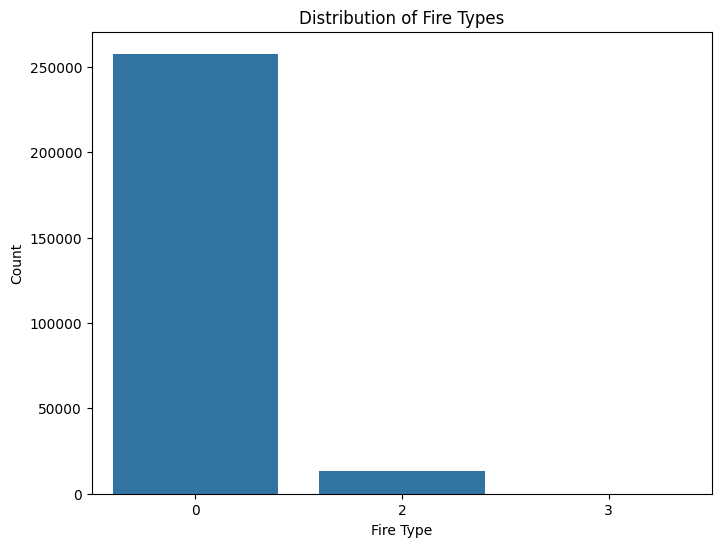

In [15]:
#here we are taking the count plot based on the type means 0,2 and 3

plt.figure(figsize=(8, 6))
sns.countplot(x='type', data=df)
plt.title('Distribution of Fire Types')
plt.xlabel('Fire Type')
plt.ylabel('Count')
plt.show()


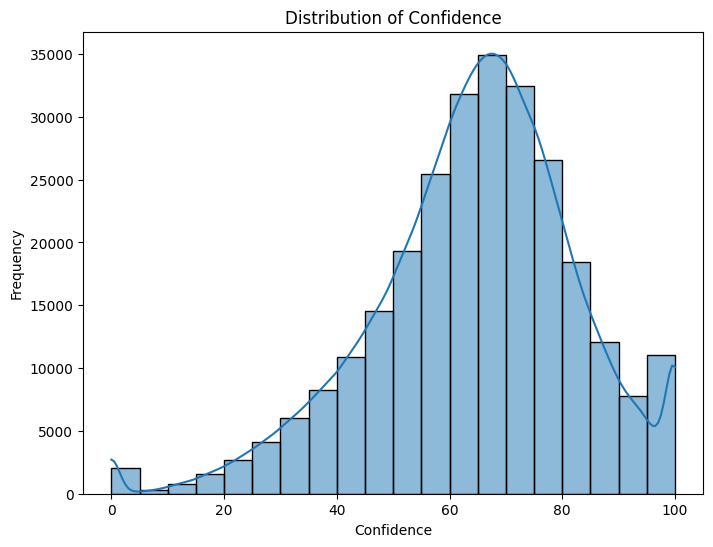

In [16]:
# Histogram of 'confidence':-
plt.figure(figsize=(8, 6))
sns.histplot(df['confidence'], bins=20, kde=True)
plt.title('Distribution of Confidence')
plt.xlabel('Confidence')
plt.ylabel('Frequency')
plt.show()

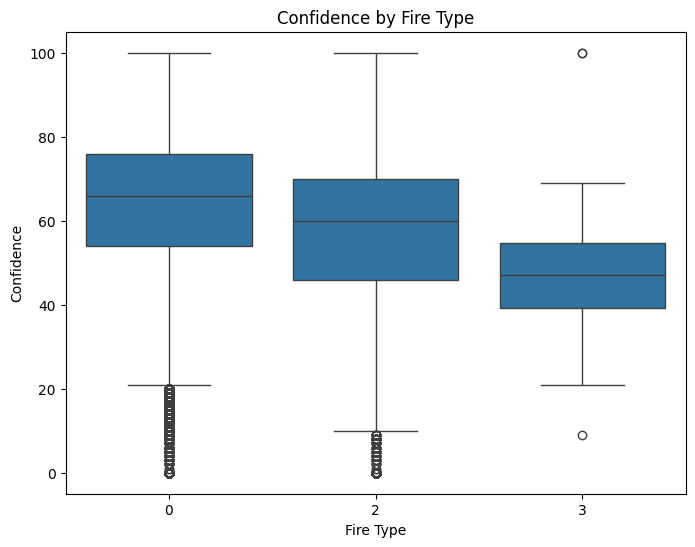

In [17]:
#Box plot for "confidence " by type

plt.figure(figsize=(8,6))
sns.boxplot(x='type', y='confidence', data=df)
plt.title('Confidence by Fire Type')
plt.xlabel('Fire Type')
plt.ylabel('Confidence')
plt.show()



# here we can see that type 0 has confidence spread out and also there are some outliers.
# and also there are many outliers present in below from 0 to 20 range  and this means that it's confidence score is very low .and

# And from type 2 , it is also simialr to type 0 but it is narrower box and slightly consistent than type 0.as_integer_ratio

# And fire type 3 has comparatively low confidence score but in this there are less outliers so this  is more consistent but low confidence.

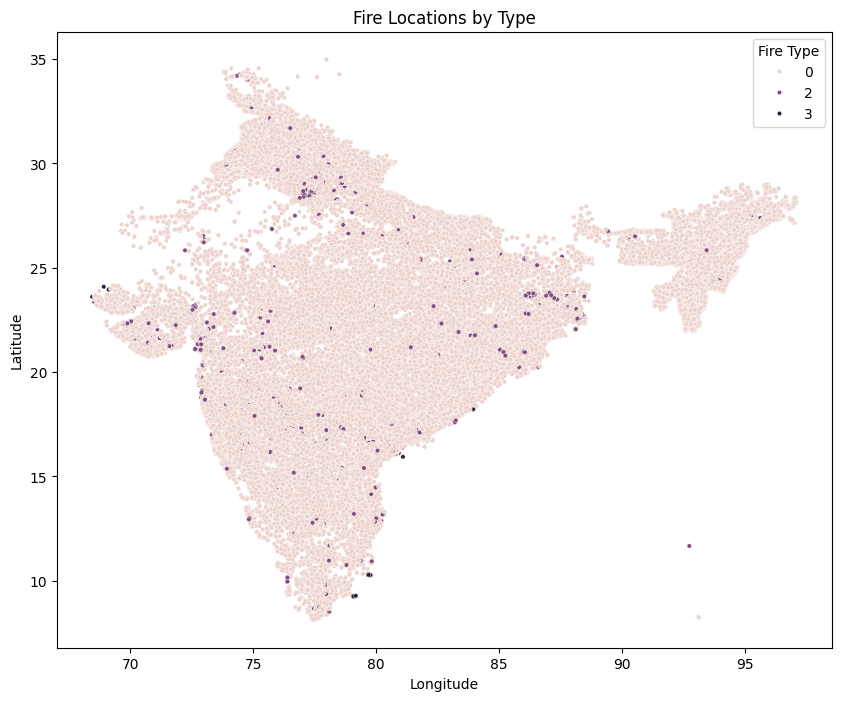

In [18]:
#Scatter plot of 'latitude' vs 'longitude'

plt.figure(figsize=(10, 8))
sns.scatterplot(x='longitude', y='latitude', data=df, hue='type', s=10)
plt.title('Fire Locations by Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Fire Type')
plt.show()




In [19]:
!pip install folium
import folium
from folium.plugins import MarkerCluster


#First we are creating a base map:-

map_center=[df['latitude'].mean(), df['longitude'].mean()]
fire_map=folium.Map(location=map_center, zoom_start=6, tiles='CartoDB positron')

#Step 2 : using MarketCluster to avoid clutter

marker_cluster = MarkerCluster().add_to(fire_map)

#step3 we are assigning different color to different fire type to understand easily

color_dict={
    0:'red',
    2:'orange',
    3:'green'
}


#step 4 looping through dataframe and add markers

for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color=color_dict.get(row['type'], 'blue'),
        fill=True,
        fill_opacity=0.6,
        popup=f"Type: {row['type']}, Confidence: {row['confidence']}"
    ).add_to(marker_cluster)


#step 5 now displaying the map:-

fire_map


# zoom in on specific type:-

df[df['type'] ==0]    #only for type 0 fires at now

fire_map.save('fire_map.html')

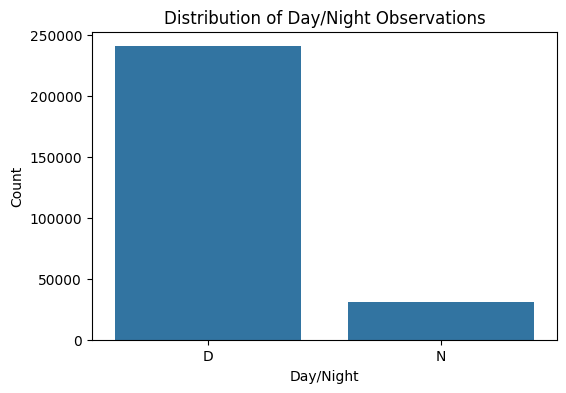

In [20]:
#Count plot for 'daynight'

plt.figure(figsize=(6, 4))
sns.countplot(x='daynight', data=df)
plt.title('Distribution of Day/Night Observations')
plt.xlabel('Day/Night')
plt.ylabel('Count')
plt.show()

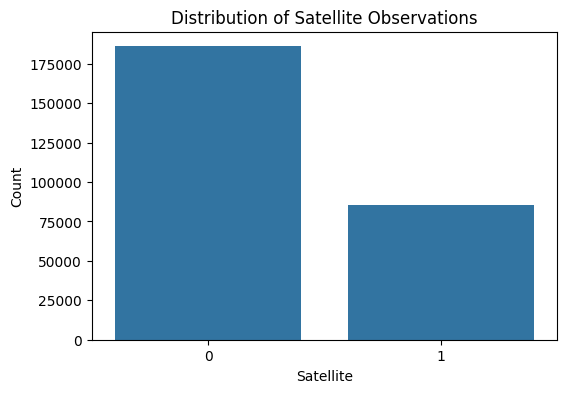

In [26]:
#Count plot for 'Satellite':-

plt.figure(figsize=(6, 4))
sns.countplot(x='satellite', data=df)
plt.title('Distribution of Satellite Observations')
plt.xlabel('Satellite')
plt.ylabel('Count')
plt.show()

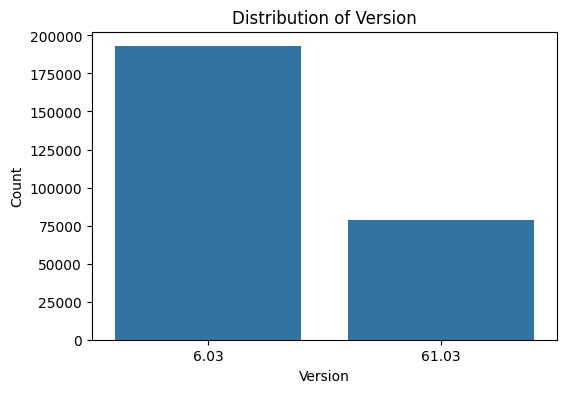

In [27]:
# Count plot for 'version':-


plt.figure(figsize=(6, 4))
sns.countplot(x='version', data=df)
plt.title('Distribution of Version')
plt.xlabel('Version')
plt.ylabel('Count')
plt.show()

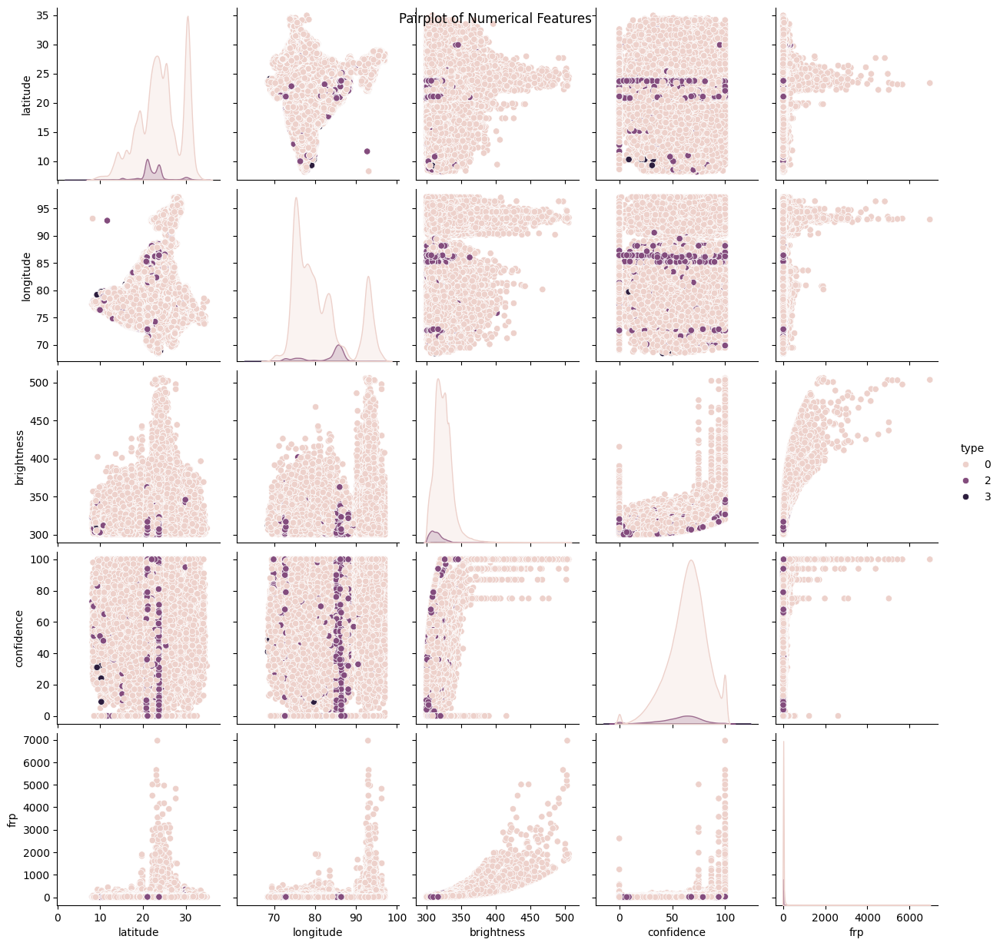

In [28]:
#this code take more time
# Pairplot for numerical features (subset)
sns.pairplot(df[['latitude', 'longitude', 'brightness', 'confidence', 'frp', 'type']], hue='type', diag_kind='kde')
plt.suptitle('Pairplot of Numerical Features')
plt.show()

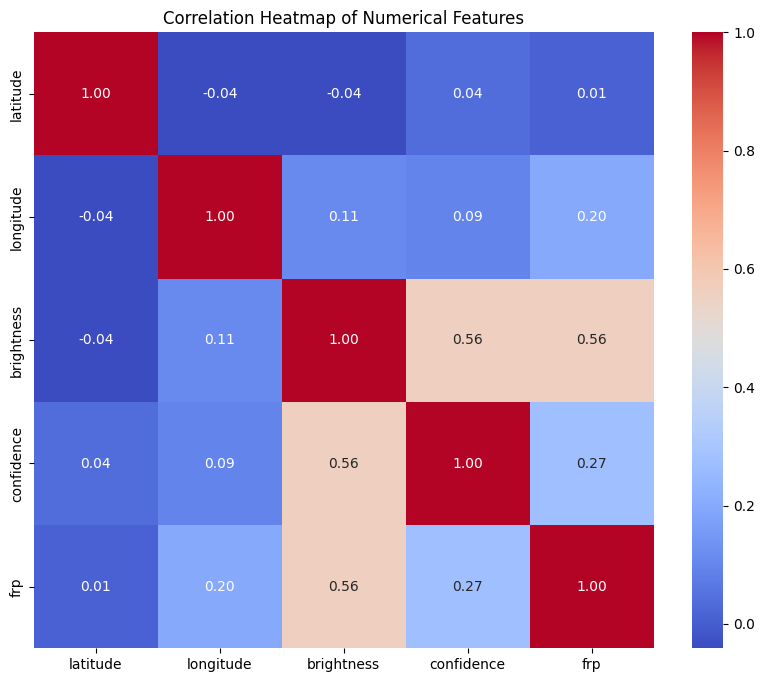

In [29]:
# Heatmap of correlations between numerical features


plt.figure(figsize=(10, 8))
correlation_matrix = df[['latitude', 'longitude', 'brightness', 'confidence', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [30]:
numerical_cols = df.select_dtypes(include=np.number).columns

In [31]:
numerical_cols

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_date',
       'acq_time', 'satellite', 'instrument', 'confidence', 'version',
       'bright_t31', 'frp', 'daynight', 'type'],
      dtype='object')

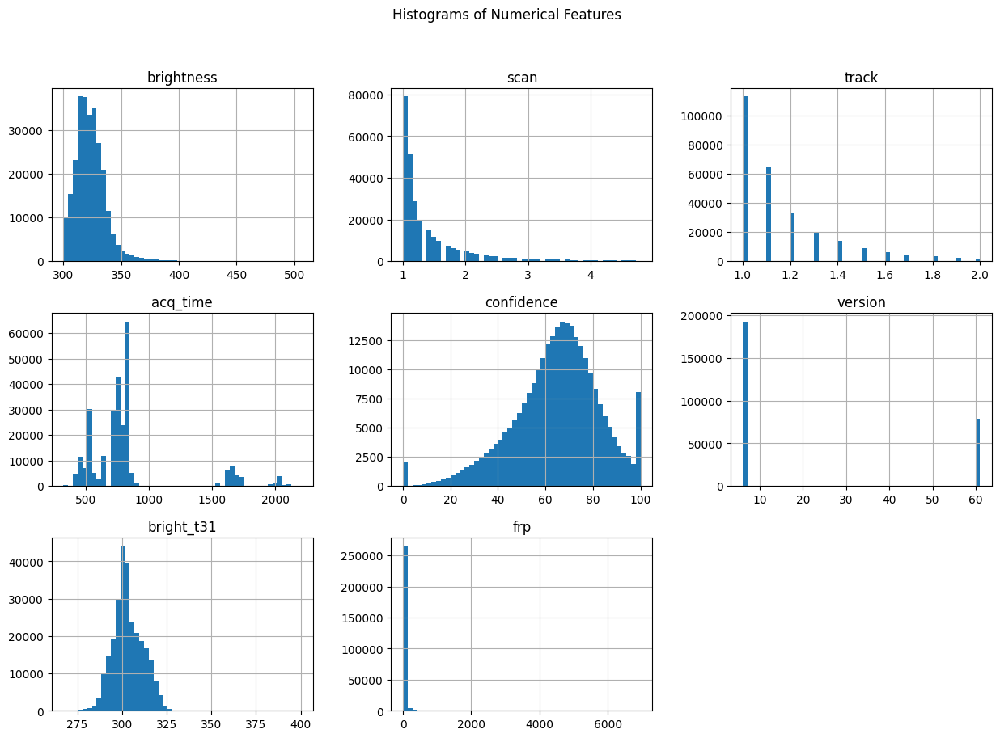

In [32]:
numerical_cols = ['brightness', 'scan', 'track', 'acq_time','confidence', 'version', 'bright_t31', 'frp']
df[numerical_cols].hist(bins=50, figsize=(15, 10))
plt.suptitle('Histograms of Numerical Features')
plt.show()

Analyzing distribution for: brightness


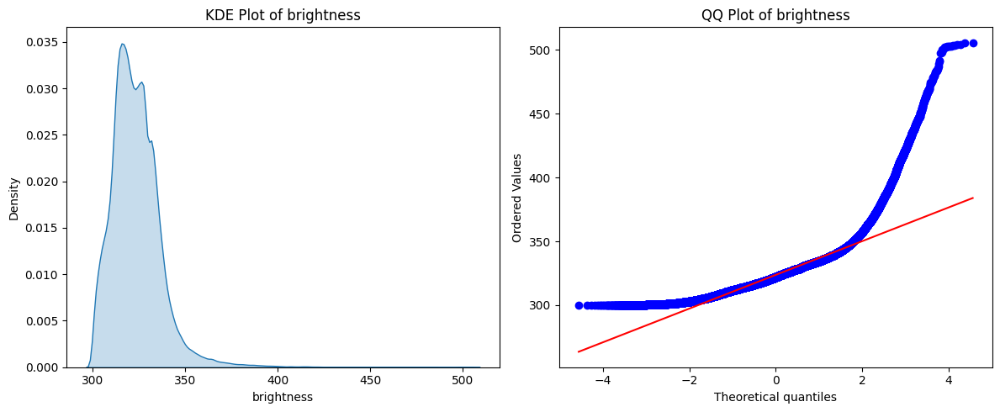

--------------------------------------------------
Analyzing distribution for: confidence


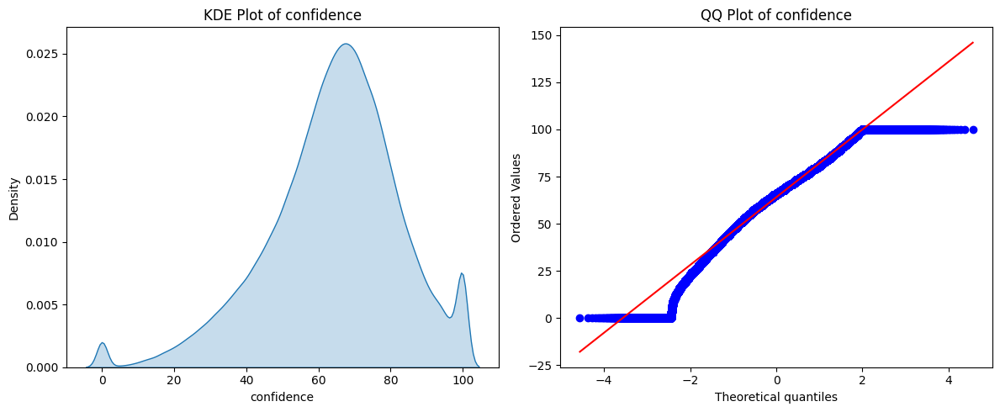

--------------------------------------------------
Analyzing distribution for: frp


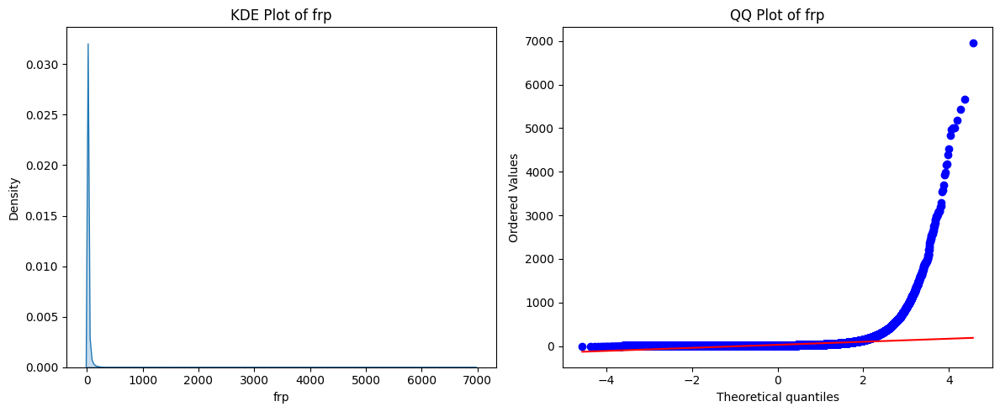

--------------------------------------------------
Analyzing distribution for: bright_t31


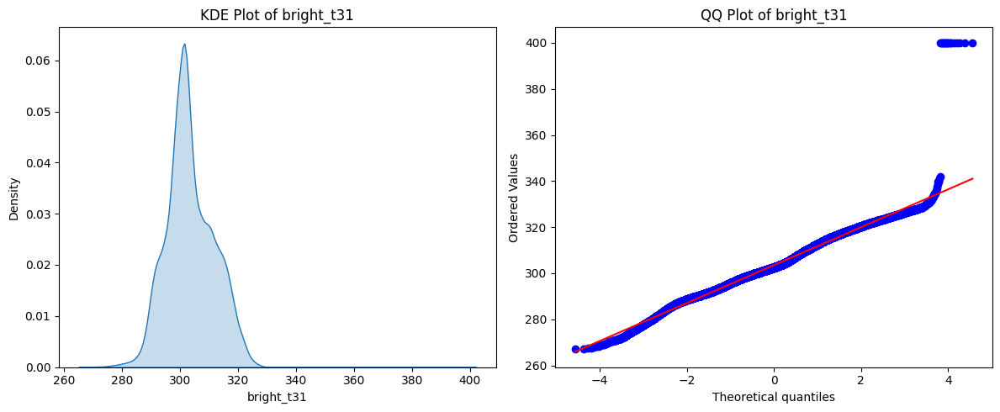

--------------------------------------------------
Analyzing distribution for: scan


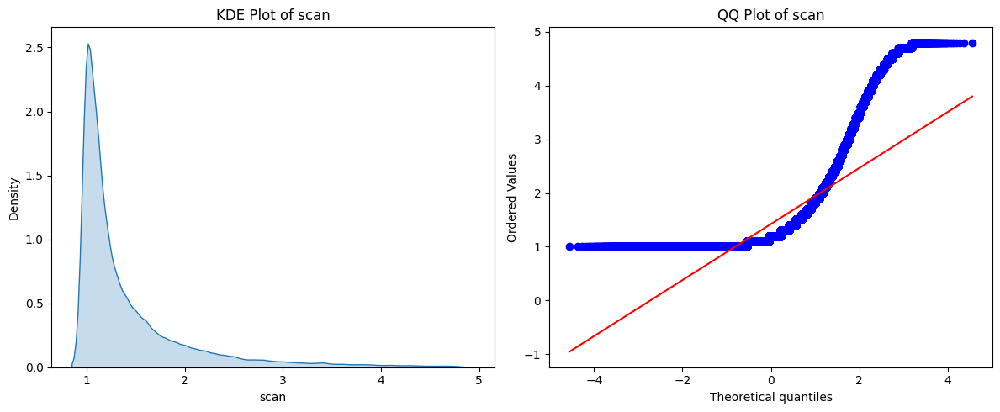

--------------------------------------------------
Analyzing distribution for: track


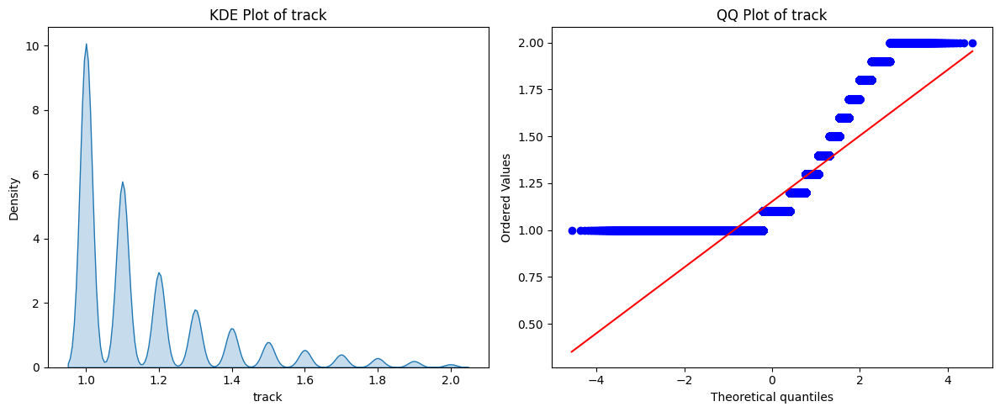

--------------------------------------------------


In [33]:
import statsmodels.api as sm
import scipy.stats as stats

# List of numerical features to check for distribution:-


numerical_features = ['brightness', 'confidence', 'frp', 'bright_t31', 'scan', 'track']

for feature in numerical_features:
    print(f"Analyzing distribution for: {feature}")

    # KDE Plot
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.kdeplot(df[feature], fill=True)
    plt.title(f'KDE Plot of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')

    # QQ Plot
    plt.subplot(1, 2, 2)
    stats.probplot(df[feature], dist="norm", plot=plt)
    plt.title(f'QQ Plot of {feature}')

    plt.tight_layout()
    plt.show()
    print("-" * 50)

In [34]:
# --- Temporal Analysis ---
# Converting 'acq_date' to datetime objects
df['acq_date'] = pd.to_datetime(df['acq_date'])
# Extract temporal features
df['year'] = df['acq_date'].dt.year
df['month'] = df['acq_date'].dt.month
df['day_of_week'] = df['acq_date'].dt.dayofweek     # Monday=0, Sunday=6
df['day_of_year'] = df['acq_date'].dt.dayofyear
df['hour'] = df['acq_time'].astype(str).str[:2].astype(int) # Assuming acq_time is HHMM

/tmp/ipython-input-38-3766763484.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='month', palette='viridis')


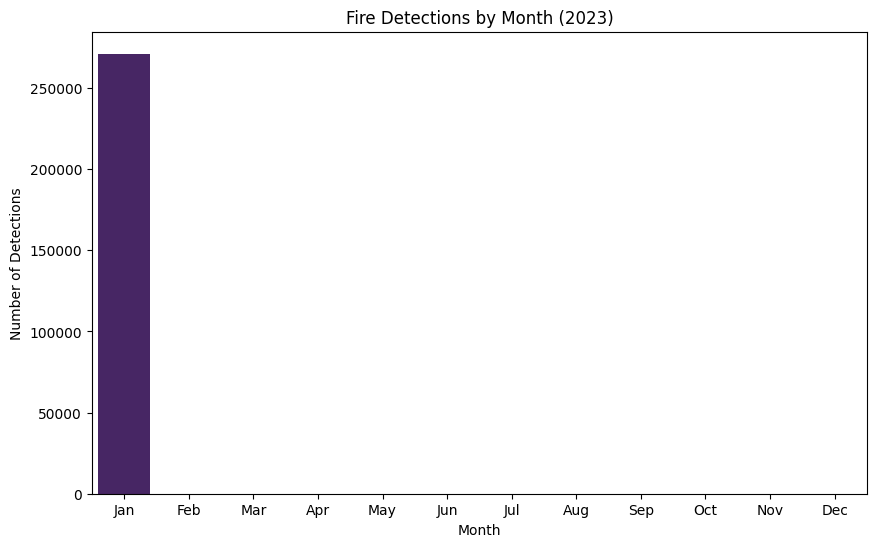

In [38]:
# Visualize fire detections over months
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='month', palette='viridis')
plt.title('Fire Detections by Month (2023)')
plt.xlabel('Month')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

/tmp/ipython-input-39-714612371.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='day_of_week', palette='viridis')


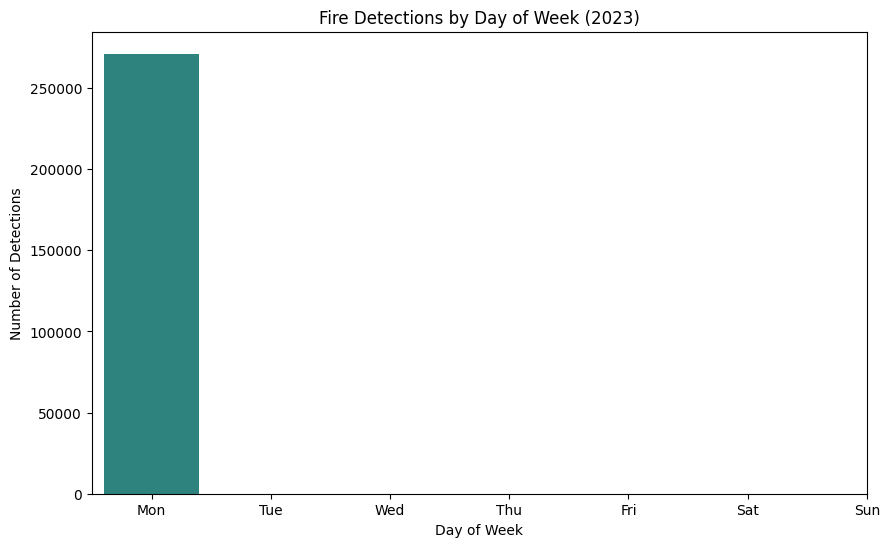

In [39]:
# Visualize fire detections by day of the week
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='day_of_week', palette='viridis')
plt.title('Fire Detections by Day of Week (2023)')
plt.xlabel('Day of Week')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()

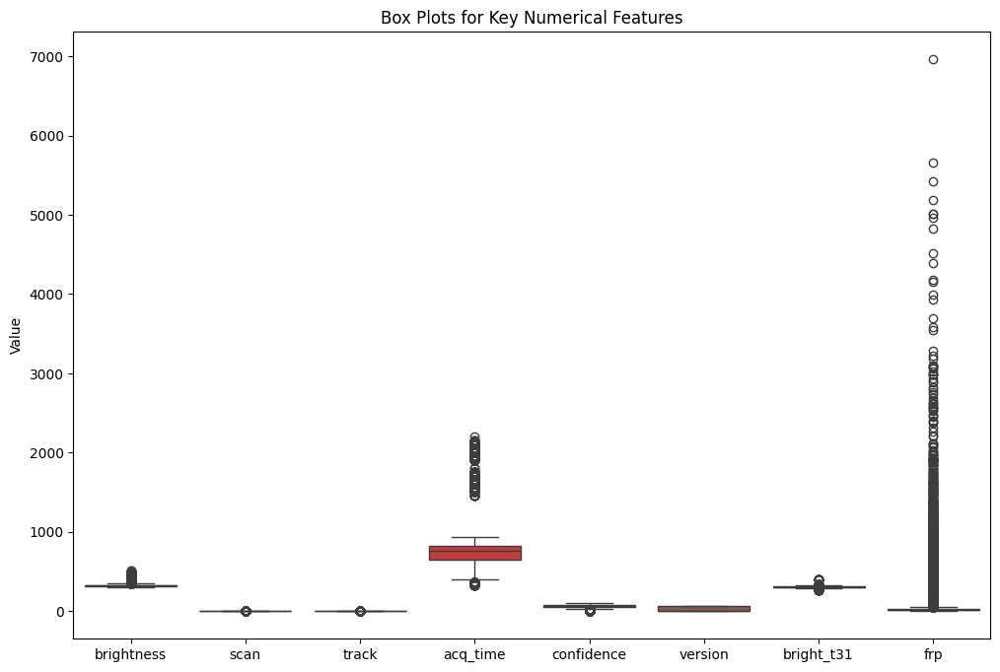

In [40]:
# Visualize outliers using box plots for key numerical features
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[numerical_cols])
plt.title('Box Plots for Key Numerical Features')
plt.ylabel('Value')
plt.show()


# here acq_time has lots of outliers present

In [41]:
def remove_outliers_iqr(df, column):
  Q1 = df[column].quantile(0.25)
  Q3 = df[column].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  df_cleaned = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)].copy()
  return df_cleaned

# Apply outlier removal to numerical columns

for col in numerical_cols:
  df = remove_outliers_iqr(df, col)

print("Shape after removing outliers:", df.shape)

Shape after removing outliers: (189370, 21)


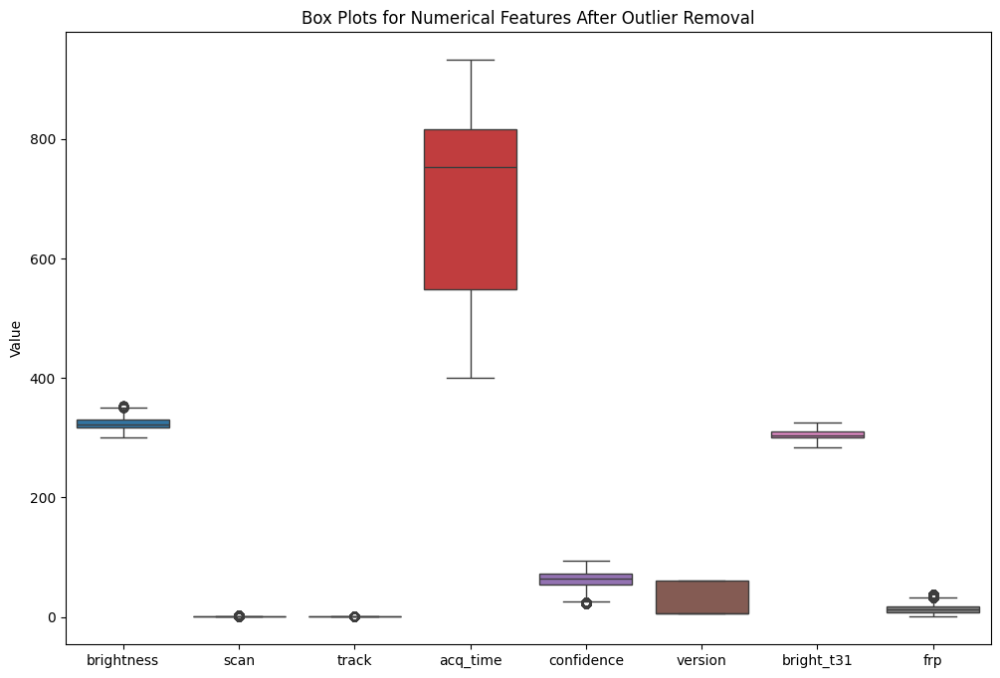

In [42]:
# Visualize box plots after outlier removal
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[numerical_cols])
plt.title('Box Plots for Numerical Features After Outlier Removal')
plt.ylabel('Value')
plt.show()

In [43]:
df.head()


,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,...,bright_t31,frp,daynight,type,year,month,day_of_week,day_of_year,hour,month_name
0,28.0993,96.9983,303.0,1.1,1.1,1970-01-01,409,1,0,44,...,292.6,8.6,0,0,1970,1,3,1,40,Jan
1,30.0420,79.6492,301.8,1.4,1.2,1970-01-01,547,1,0,37,...,287.4,9.0,0,0,1970,1,3,1,54,Jan
3,30.0408,80.0501,302.0,1.5,1.2,1970-01-01,547,1,0,46,...,287.7,10.7,0,0,1970,1,3,1,54,Jan
4,30.6565,78.9668,300.9,1.3,1.1,1970-01-01,547,1,0,43,...,287.6,9.0,0,0,1970,1,3,1,54,Jan
6,31.4366,76.8988,300.5,1.0,1.0,1970-01-01,547,1,0,36,...,287.2,5.3,0,0,1970,1,3,1,54,Jan


In [44]:

df.type.value_counts()

,count
type,
0,182841
2,6501
3,28


In [46]:
categorical_cols = df.select_dtypes(include='object').columns

categorical_cols

Index([], dtype='object')

In [47]:
# Select categorical columns for encoding
categorical_cols_to_encode = ['daynight', 'satellite', 'instrument']

# Apply One-Hot Encoding
df_encoded = pd.get_dummies(df, columns=categorical_cols_to_encode, drop_first=True)


In [48]:
df_encoded.head(100)


,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,hour,month_name,satellite_1
0,28.0993,96.9983,303.0,1.1,1.1,1970-01-01 00:00:00.000000000,409,44,6.03,292.6,8.6,0,1970,1,3,1,40,Jan,True
1,30.0420,79.6492,301.8,1.4,1.2,1970-01-01 00:00:00.000000000,547,37,6.03,287.4,9.0,0,1970,1,3,1,54,Jan,True
3,30.0408,80.0501,302.0,1.5,1.2,1970-01-01 00:00:00.000000000,547,46,6.03,287.7,10.7,0,1970,1,3,1,54,Jan,True
4,30.6565,78.9668,300.9,1.3,1.1,1970-01-01 00:00:00.000000000,547,43,6.03,287.6,9.0,0,1970,1,3,1,54,Jan,True
6,31.4366,76.8988,300.5,1.0,1.0,1970-01-01 00:00:00.000000000,547,36,6.03,287.2,5.3,0,1970,1,3,1,54,Jan,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,23.7766,86.3997,313.8,1.0,1.0,1970-01-01 00:00:00.000000001,454,51,6.03,300.9,6.8,2,1970,1,3,1,45,Jan,True
117,23.6829,86.0831,310.4,1.1,1.0,1970-01-01 00:00:00.000000001,454,61,6.03,297.3,6.2,2,1970,1,3,1,45,Jan,True
118,23.6661,86.9215,308.2,1.0,1.0,1970-01-01 00:00:00.000000001,454,50,6.03,297.4,4.8,2,1970,1,3,1,45,Jan,True
119,23.8059,86.3222,313.5,1.0,1.0,1970-01-01 00:00:00.000000001,454,66,6.03,300.9,8.1,0,1970,1,3,1,45,Jan,True


In [49]:
df_encoded.type.value_counts()

,count
type,
0,182841
2,6501
3,28


In [50]:
# Create map and sample data
india_map = folium.Map(location=[22.351115, 78.667743], zoom_start=5)
sample_df = df_encoded.sample(n=min(10000, len(df_encoded)), random_state=42)

# Add markers
for _, row in sample_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.6,
        popup=f"FRP: {row['frp']:.2f}, Date: {row['acq_date'].strftime('%Y-%m-%d')}"
    ).add_to(india_map)

display(india_map)

In [52]:
scaler =StandardScaler()
numerical_cols_to_scale = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
df_encoded[numerical_cols_to_scale] = scaler.fit_transform(df_encoded[numerical_cols_to_scale])

df_encoded.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,hour,month_name,satellite_1
0,28.0993,96.9983,-2.308455,-0.464860,0.059274,1970-01-01,409,-1.319370,6.03,-1.754135,-0.735900,0,1970,1,3,1,40,Jan,True
1,30.0420,79.6492,-2.445530,0.588678,0.936416,1970-01-01,547,-1.818736,6.03,-2.471213,-0.683381,0,1970,1,3,1,54,Jan,True
3,30.0408,80.0501,-2.422684,0.939857,0.936416,1970-01-01,547,-1.176694,6.03,-2.429843,-0.460175,0,1970,1,3,1,54,Jan,True
4,30.6565,78.9668,-2.548336,0.237499,0.059274,1970-01-01,547,-1.390708,6.03,-2.443633,-0.683381,0,1970,1,3,1,54,Jan,True
6,31.4366,76.8988,-2.594027,-0.816039,-0.817867,1970-01-01,547,-1.890074,6.03,-2.498792,-1.169182,0,1970,1,3,1,54,Jan,True


In [53]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 189370 entries, 0 to 271207
Data columns (total 19 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   latitude     189370 non-null  float64       
 1   longitude    189370 non-null  float64       
 2   brightness   189370 non-null  float64       
 3   scan         189370 non-null  float64       
 4   track        189370 non-null  float64       
 5   acq_date     189370 non-null  datetime64[ns]
 6   acq_time     189370 non-null  int64         
 7   confidence   189370 non-null  float64       
 8   version      189370 non-null  float64       
 9   bright_t31   189370 non-null  float64       
 10  frp          189370 non-null  float64       
 11  type         189370 non-null  int64         
 12  year         189370 non-null  int32         
 13  month        189370 non-null  category      
 14  day_of_week  189370 non-null  int32         
 15  day_of_year  189370 non-null  int32    

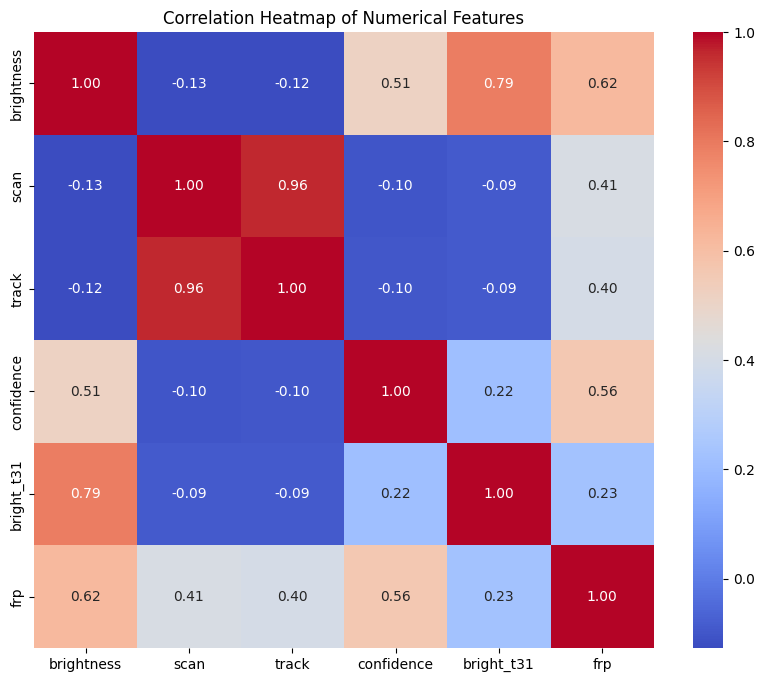

In [54]:
# Heatmap of   orrelation between numerical features

plt.figure(figsize=(10, 8))
correlation_matrix = df_encoded[['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [55]:
df_encoded.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,hour,month_name,satellite_1
0,28.0993,96.9983,-2.308455,-0.464860,0.059274,1970-01-01,409,-1.319370,6.03,-1.754135,-0.735900,0,1970,1,3,1,40,Jan,True
1,30.0420,79.6492,-2.445530,0.588678,0.936416,1970-01-01,547,-1.818736,6.03,-2.471213,-0.683381,0,1970,1,3,1,54,Jan,True
3,30.0408,80.0501,-2.422684,0.939857,0.936416,1970-01-01,547,-1.176694,6.03,-2.429843,-0.460175,0,1970,1,3,1,54,Jan,True
4,30.6565,78.9668,-2.548336,0.237499,0.059274,1970-01-01,547,-1.390708,6.03,-2.443633,-0.683381,0,1970,1,3,1,54,Jan,True
6,31.4366,76.8988,-2.594027,-0.816039,-0.817867,1970-01-01,547,-1.890074,6.03,-2.498792,-1.169182,0,1970,1,3,1,54,Jan,True


In [57]:
df_encoded.type.value_counts()

,count
type,
0,182841
2,6501
3,28


In [58]:
features=['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
target='type'

X=df_encoded[features]
y=df_encoded[target]


In [59]:
X

,brightness,scan,track,confidence,bright_t31,frp
0,-2.308455,-0.464860,0.059274,-1.319370,-1.754135,-0.735900
1,-2.445530,0.588678,0.936416,-1.818736,-2.471213,-0.683381
3,-2.422684,0.939857,0.936416,-1.176694,-2.429843,-0.460175
4,-2.548336,0.237499,0.059274,-1.390708,-2.443633,-0.683381
6,-2.594027,-0.816039,-0.817867,-1.890074,-2.498792,-1.169182
...,...,...,...,...,...,...
271199,-0.423680,1.642216,1.813557,-0.605991,0.369517,0.327610
271200,-0.846327,3.398112,2.690698,-1.319370,-0.085551,0.209442
271201,-0.789212,1.993395,1.813557,-1.105356,-0.306191,-0.079412
271204,-0.115262,1.993395,1.813557,0.678093,0.093718,1.679975


In [60]:
y

,type
0,0
1,0
3,0
4,0
6,0
...,...
271199,0
271200,0
271201,0
271204,0


In [61]:
!pip install -U  imbalanced-learn
from imblearn.over_sampling import SMOTE

In [62]:
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)


print("Distribution of target variable after SMOTE:")
print(y_resampled.value_counts())


Distribution of target variable after SMOTE:
type
0    182841
2    182841
3    182841
Name: count, dtype: int64


In [63]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

In [21]:
#categorical Column Encoding:-


le = LabelEncoder()
for col in df.select_dtypes(include=['object']).columns:
    df[col] = le.fit_transform(df[col])


# Becoz we know that ml models only understand numerical data or numbers not strings or objects.
# so if some columns like version , satellite ,  etc are in string type , then it is good practice to convert them into numbers.

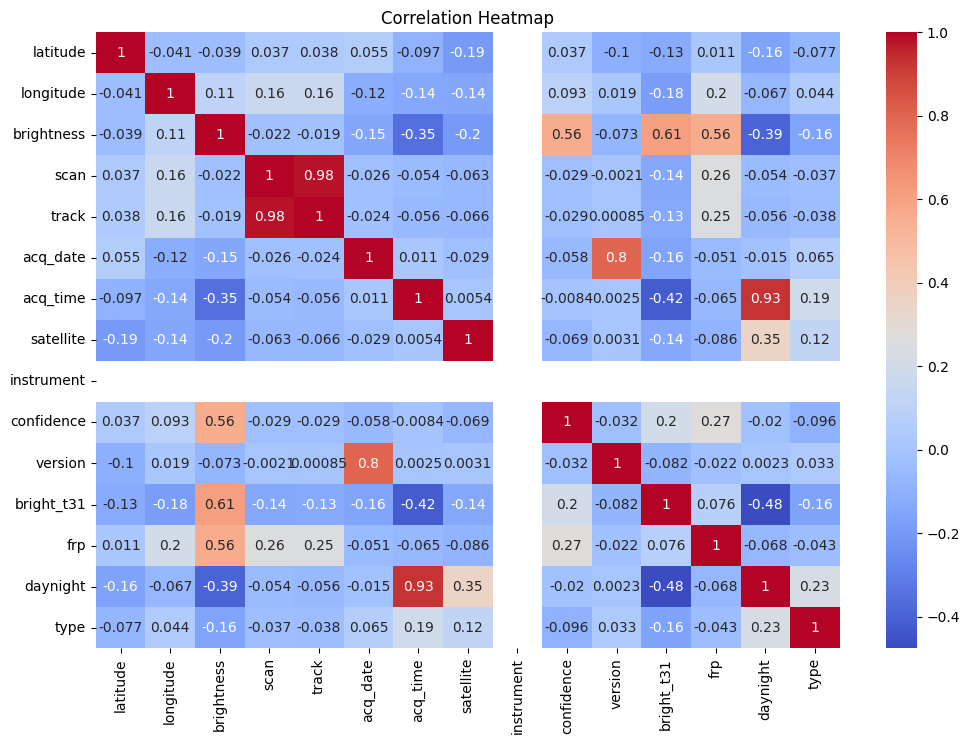

In [22]:
#Correlation Heatmap:-

plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


# this will help us in feature selection part as correlation matrix gives us idea that how one feature is strongly related to other one

In [23]:
# Feature Selection using SelectKBest:-


X= df.drop('type', axis=1)
y= df['type']


# we are also removing some constant columns as it doen't give any new thing to the model

constant_cols = [col for col in X.columns if X[col].nunique() == 1]
X = X.drop(columns=constant_cols)



selector = SelectKBest(score_func=f_classif, k=10)
X_new = selector.fit_transform(X, y)



# we are using this method becoz in dataset there are many features which are not related or which does not impact our output.
# So this method(SelectKBest) will choose 10 best features from the dataset and  ultimately it will reduce noise and improves accuracy of our model.

In [24]:
# and we can also check the top 10 best features :-


mask= selector.get_support()

selected_features = X.columns[mask]
print("Top 10 Selected Features:")
print(selected_features)

Top 10 Selected Features:
Index(['latitude', 'longitude', 'brightness', 'acq_date', 'acq_time',
       'satellite', 'confidence', 'bright_t31', 'frp', 'daynight'],
      dtype='object')


In [25]:
# Train- test split

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_new)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
